In [2]:
!pip install albumentations
from torchvision import transforms
from data import CustomDataset
from torch.utils.data import Dataset, DataLoader, RandomSampler, SequentialSampler
import torch 
from train import create_model
import matplotlib.pyplot as plt 
import matplotlib.patches as patches 
import numpy as np
from tqdm import tqdm 
import glob
from PIL import Image
import torchvision

     |████████████████████████████████| 369 kB 1.6 MB/s eta 0:00:01
     |████████████████████████████████| 95.2 MB 9.6 MB/s eta 0:00:012
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 444 kB 12.4 MB/s eta 0:00:01
     |████████████████████████████████| 176 kB 13.0 MB/s eta 0:00:01
     |████████████████████████████████| 79 kB 6.8 MB/s  eta 0:00:01
     |████████████████████████████████| 2.0 MB 7.9 MB/s eta 0:00:01
  ERROR: Command errored out with exit status 1:
   command: /Users/kule/opt/anaconda3/bin/python /Users/kule/opt/anaconda3/lib/python3.9/site-packages/pip/_vendor/pep517/in_process/_in_process.py build_wheel /var/folders/jt/0gc77scs1dq06yh5mvn_qc680000gn/T/tmpncvle1fv
       cwd: /private/var/folders/jt/0gc77scs1dq06yh5mvn_qc680000gn/T/pip-install-28px5iw8/opencv-python-headless_0b6532473d224f42b08d5c7fd32bb5dd
  C

ModuleNotFoundError: No module named 'albumentations'

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
class_names = ['background','Capacitor', 'Cylinder', 'Motor', 'Shock absorber', 'container']

In [4]:
label2idx = {label: idx for idx, label in enumerate(class_names)}
idx2label = {idx: label for idx, label in enumerate(class_names)}
idx2label

{0: 'background',
 1: 'Capacitor',
 2: 'Cylinder',
 3: 'Motor',
 4: 'Shock absorber',
 5: 'container'}

In [5]:
TEST_IMAGES = glob.glob("/home/anukul/Thesis_Data/Photoscrap/*")

In [6]:
model = create_model(num_classes=6)
model.to(device)
checkpoint_path = "/home/anukul/Thesis_Object_Detection_Code/recent_epoch_model.pth"
checkpoint = torch.load(checkpoint_path, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [7]:
def visualize_predictions(image, boxes, labels, scores, threshold=0.5):
    """
    Visualize bounding boxes on image
    """
    # Convert tensor to PIL Image if needed
    if isinstance(image, torch.Tensor):
        if image.is_cuda:
            image = image.cpu()
        # Assuming image is in format [C, H, W]
        image = image.permute(1, 2, 0).numpy()
        if image.max() <= 1.0:
            image = (image * 255).astype(np.uint8)
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    ax.imshow(image)
    
    # Filter predictions by confidence threshold
    valid_indices = scores >= threshold
    boxes = boxes[valid_indices]
    labels = labels[valid_indices]
    scores = scores[valid_indices]
    
    # Draw bounding boxes
    for box, label, score in zip(boxes, labels, scores):
        x1, y1, x2, y2 = box
        width = x2 - x1
        height = y2 - y1
        
        # Create rectangle patch
        rect = patches.Rectangle((x1, y1), width, height, 
                               linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        
        # Add label and score
        label_text = f'{class_names[label]}: {score:.2f}'
        ax.text(x1, y1-5, label_text, fontsize=10, color='red', 
                bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))
    
    ax.set_title(f'Predictions (threshold: {threshold})')
    ax.axis('off')
    plt.tight_layout()
    plt.show()

Testing:   0%|          | 0/294 [00:00<?, ?it/s]


Image 1:
Number of detections (confidence > 0): 0
No detections above threshold

Image 2:
Number of detections (confidence > 0): 3
Predictions:
  1. Class: Motor (ID: 3), Score: 0.657, Box: [466.1, 343.7, 534.3, 422.1]
  2. Class: Cylinder (ID: 2), Score: 0.549, Box: [44.3, 266.7, 117.2, 338.5]
  3. Class: Shock absorber (ID: 4), Score: 0.485, Box: [53.8, 271.9, 112.0, 332.3]


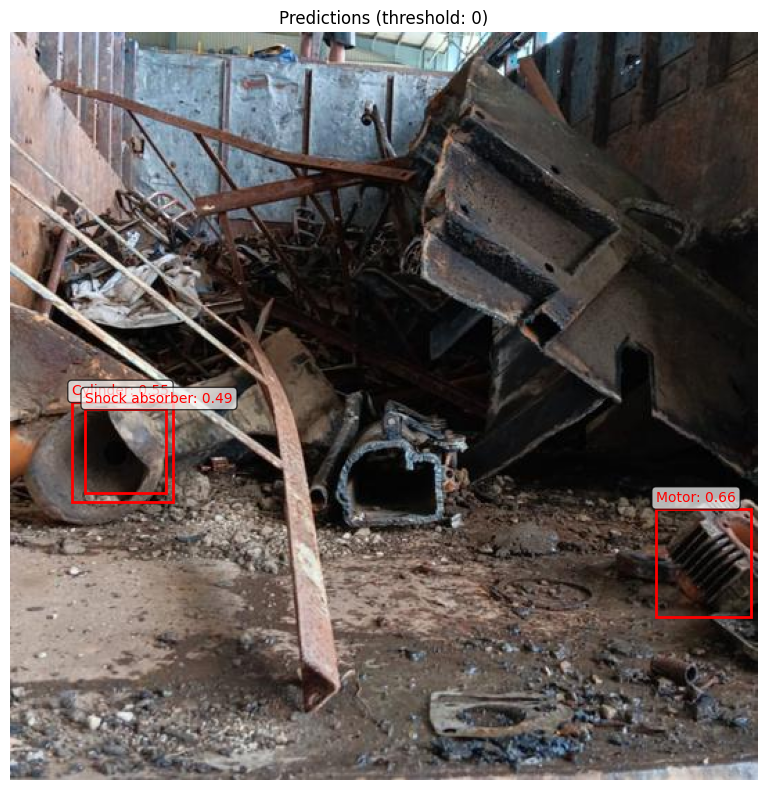

Testing:   1%|          | 2/294 [00:00<01:18,  3.74it/s]


Image 3:
Number of detections (confidence > 0): 1
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.175, Box: [120.2, 350.5, 334.3, 514.6]


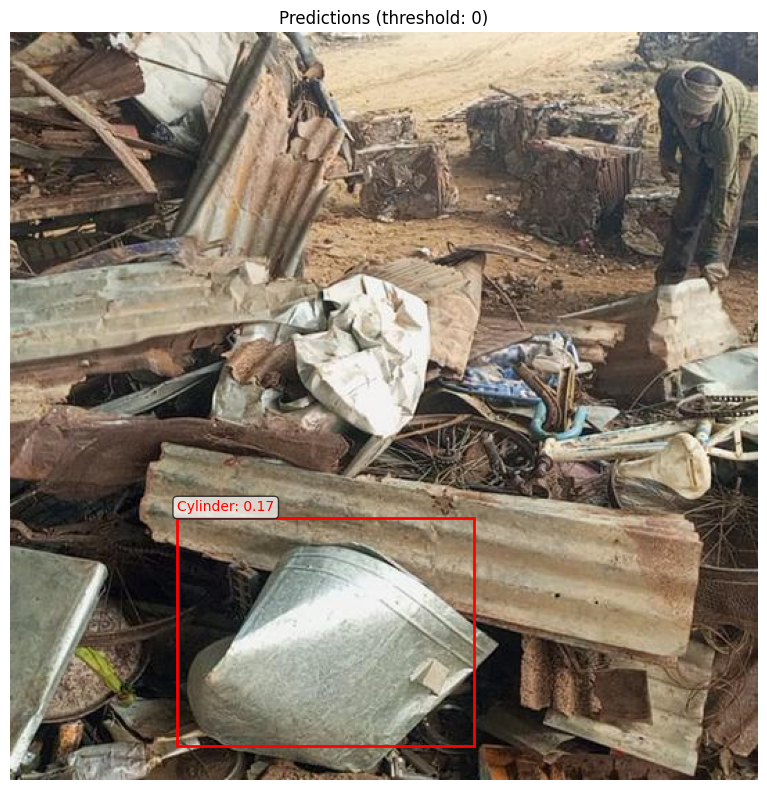

Testing:   1%|          | 3/294 [00:01<01:44,  2.78it/s]


Image 4:
Number of detections (confidence > 0): 3
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.175, Box: [108.6, 240.8, 468.8, 397.0]
  2. Class: Cylinder (ID: 2), Score: 0.116, Box: [424.5, 89.2, 540.0, 195.1]
  3. Class: container (ID: 5), Score: 0.101, Box: [430.9, 42.2, 539.2, 230.9]


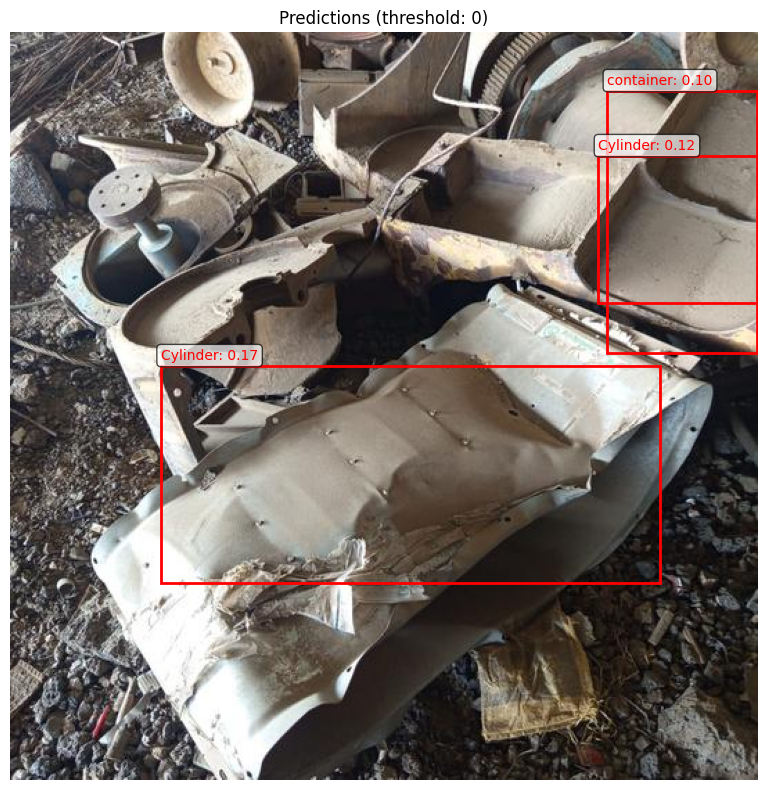

Testing:   1%|▏         | 4/294 [00:01<01:55,  2.50it/s]


Image 5:
Number of detections (confidence > 0): 0
No detections above threshold

Image 6:
Number of detections (confidence > 0): 1
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.570, Box: [264.5, 294.0, 301.4, 327.3]


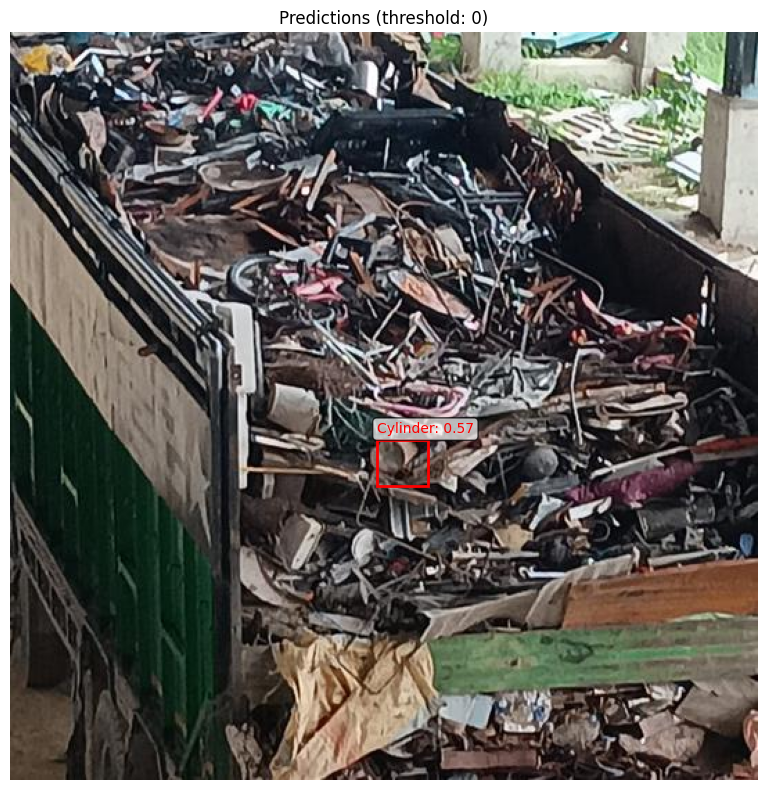

Testing:   2%|▏         | 6/294 [00:02<01:33,  3.07it/s]


Image 7:
Number of detections (confidence > 0): 1
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.067, Box: [302.4, 360.5, 430.3, 530.3]


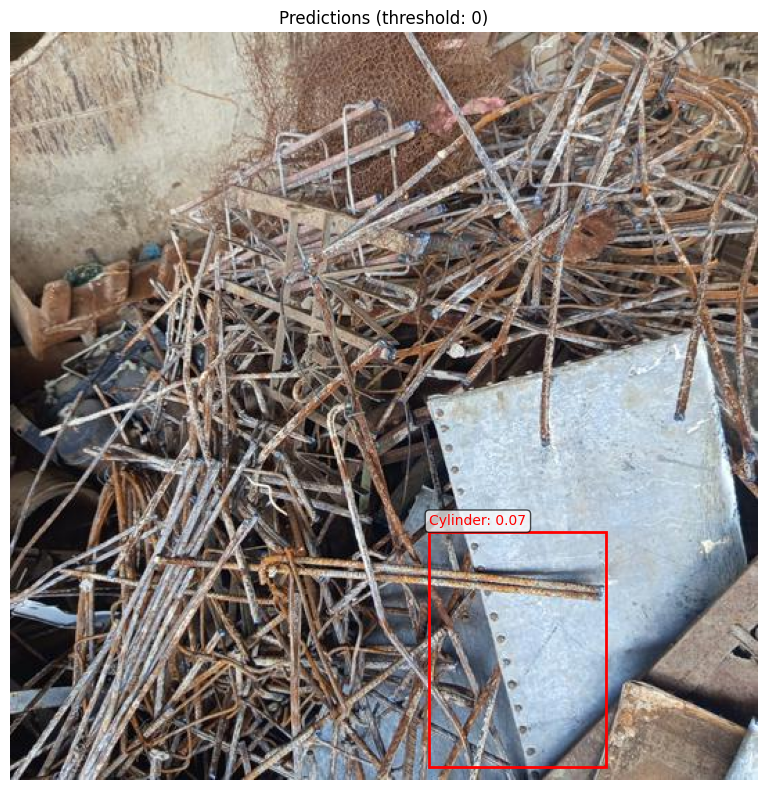

Testing:   2%|▏         | 7/294 [00:02<01:46,  2.70it/s]


Image 8:
Number of detections (confidence > 0): 5
Predictions:
  1. Class: container (ID: 5), Score: 0.121, Box: [29.8, 434.0, 154.9, 535.1]
  2. Class: Shock absorber (ID: 4), Score: 0.104, Box: [3.2, 182.5, 84.3, 262.4]
  3. Class: container (ID: 5), Score: 0.068, Box: [117.8, 73.0, 187.6, 100.3]
  4. Class: Cylinder (ID: 2), Score: 0.056, Box: [203.1, 364.7, 366.9, 536.5]
  5. Class: container (ID: 5), Score: 0.051, Box: [82.4, 63.0, 215.5, 108.8]


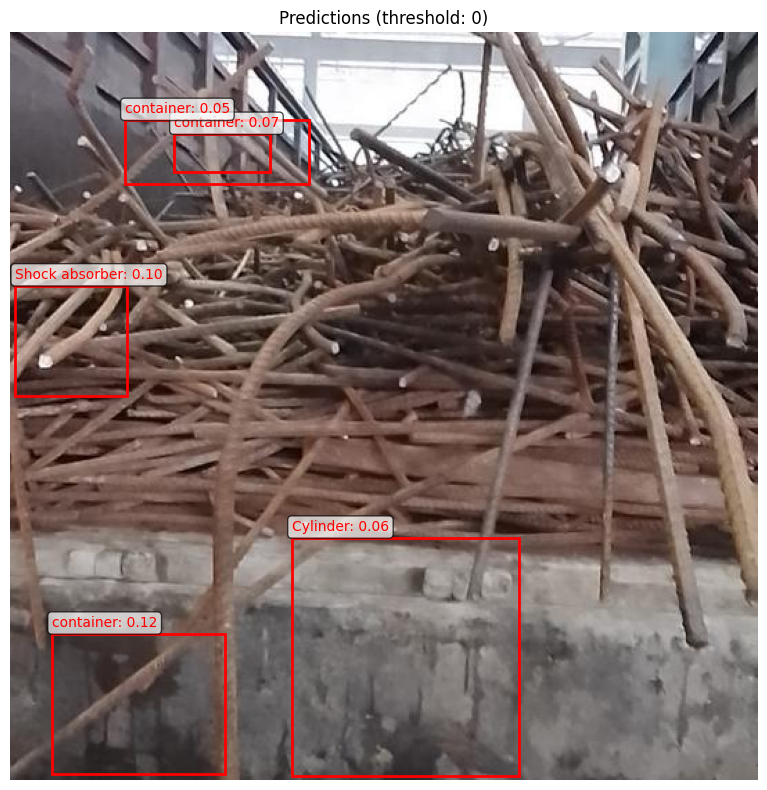

Testing:   3%|▎         | 8/294 [00:02<01:52,  2.55it/s]


Image 9:
Number of detections (confidence > 0): 5
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.251, Box: [302.5, 450.9, 382.1, 534.9]
  2. Class: Cylinder (ID: 2), Score: 0.176, Box: [269.3, 443.0, 408.7, 539.0]
  3. Class: Cylinder (ID: 2), Score: 0.104, Box: [325.4, 454.3, 362.7, 529.4]
  4. Class: Cylinder (ID: 2), Score: 0.052, Box: [321.3, 429.4, 398.5, 529.4]
  5. Class: Cylinder (ID: 2), Score: 0.050, Box: [240.9, 373.6, 363.5, 537.3]


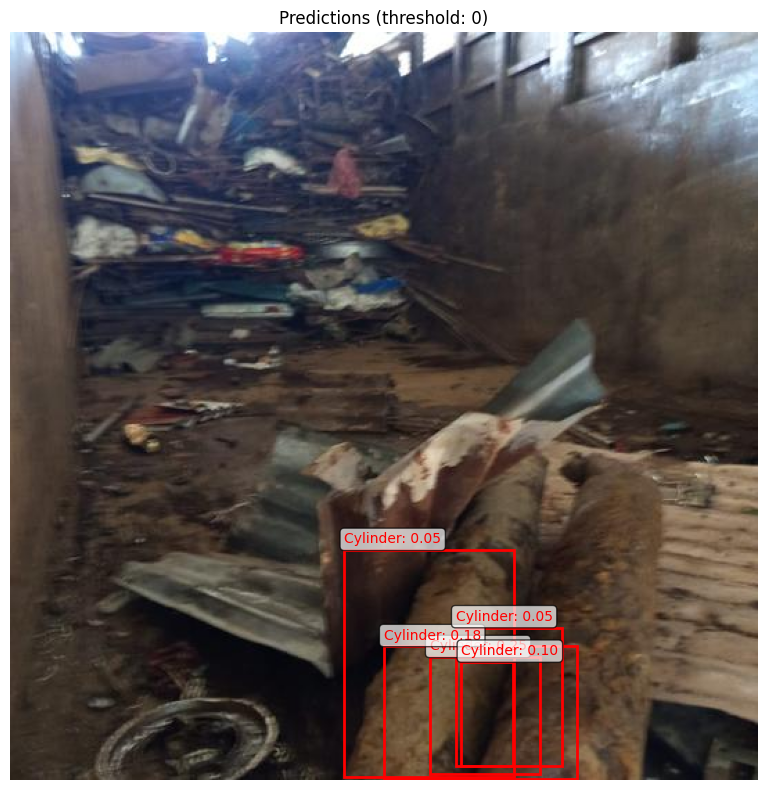

Testing:   3%|▎         | 9/294 [00:03<01:57,  2.43it/s]


Image 10:
Number of detections (confidence > 0): 1
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.063, Box: [357.7, 164.0, 465.3, 249.2]


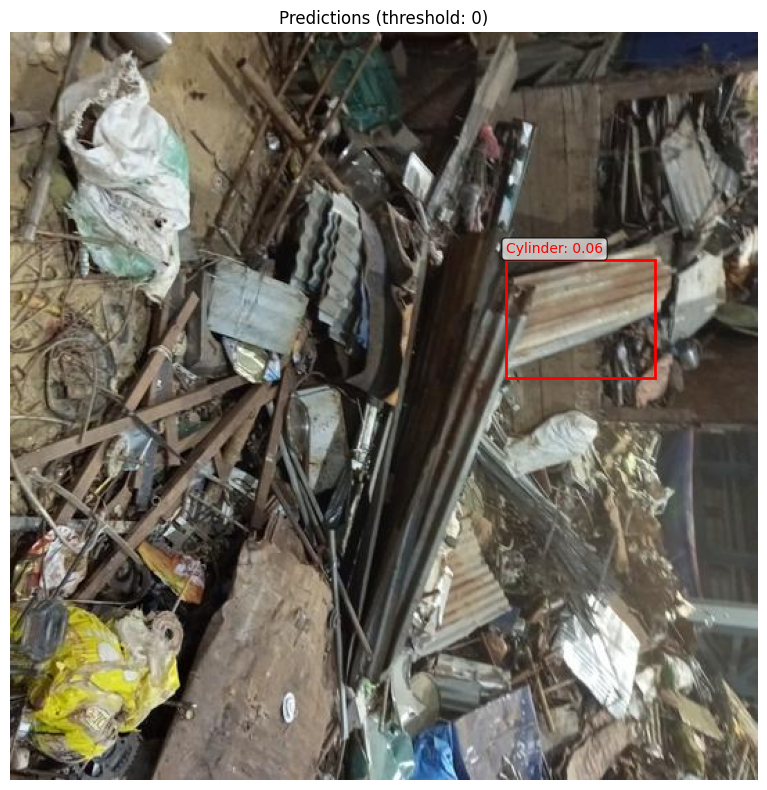

Testing:   3%|▎         | 10/294 [00:03<02:02,  2.32it/s]


Image 11:
Number of detections (confidence > 0): 2
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.177, Box: [448.1, 471.5, 499.3, 516.3]
  2. Class: Cylinder (ID: 2), Score: 0.116, Box: [192.4, 187.1, 230.5, 217.5]


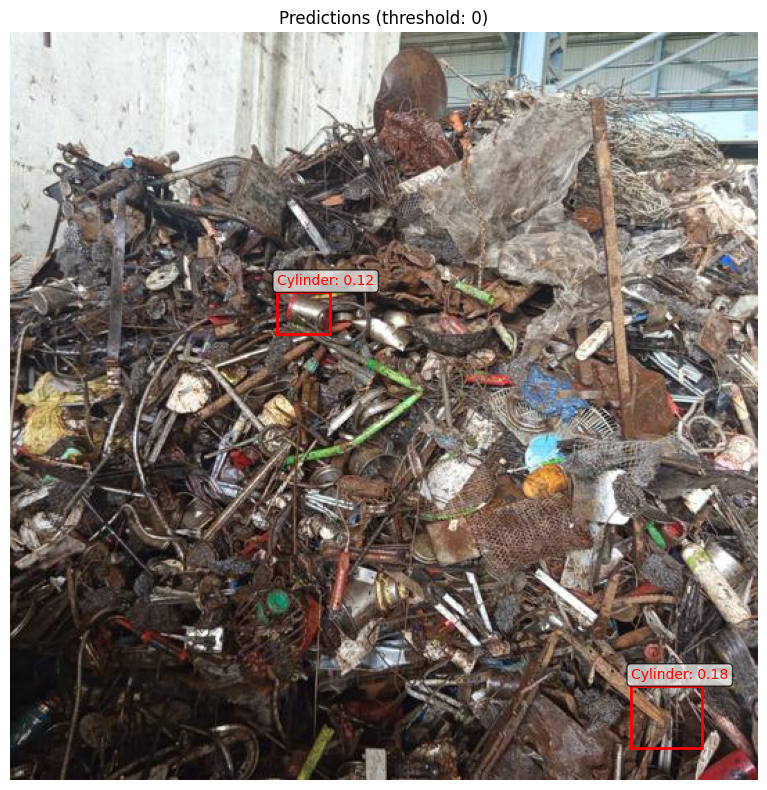

Testing:   4%|▎         | 11/294 [00:04<02:08,  2.21it/s]


Image 12:
Number of detections (confidence > 0): 10
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.128, Box: [105.0, 207.5, 254.5, 268.1]
  2. Class: container (ID: 5), Score: 0.106, Box: [313.7, 214.6, 507.1, 403.4]
  3. Class: container (ID: 5), Score: 0.089, Box: [238.9, 142.5, 319.2, 238.6]
  4. Class: Cylinder (ID: 2), Score: 0.083, Box: [171.8, 216.6, 214.4, 264.3]
  5. Class: container (ID: 5), Score: 0.077, Box: [257.2, 183.0, 523.6, 508.4]
  6. Class: Cylinder (ID: 2), Score: 0.063, Box: [147.3, 226.7, 234.3, 252.7]
  7. Class: Cylinder (ID: 2), Score: 0.062, Box: [226.9, 253.0, 519.0, 494.4]
  8. Class: Cylinder (ID: 2), Score: 0.061, Box: [185.3, 248.2, 204.3, 268.8]
  9. Class: Cylinder (ID: 2), Score: 0.057, Box: [177.8, 251.4, 209.6, 265.9]
  10. Class: Cylinder (ID: 2), Score: 0.051, Box: [189.0, 229.6, 235.1, 257.5]


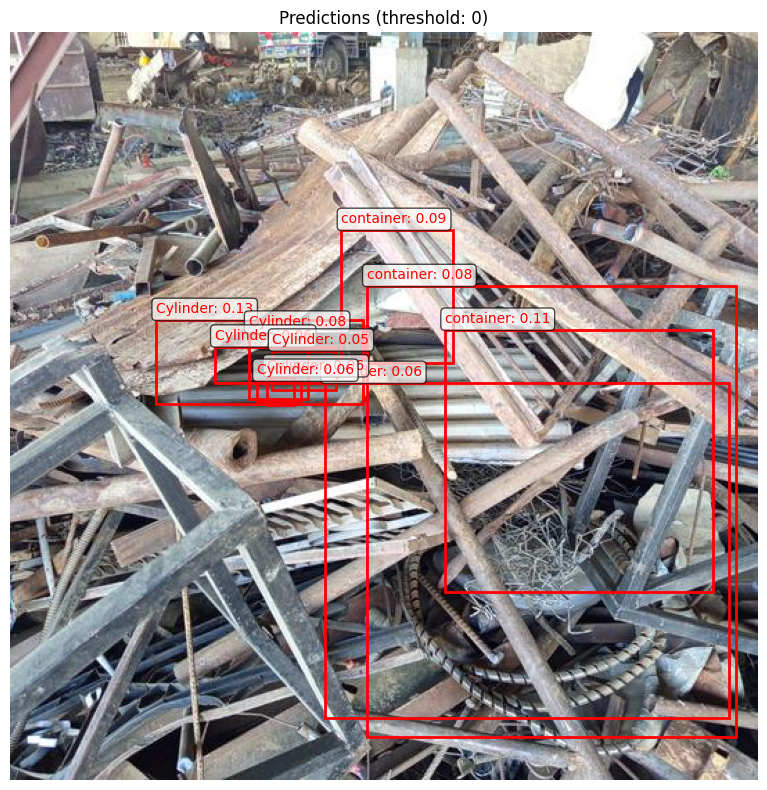

Testing:   4%|▍         | 12/294 [00:04<02:16,  2.07it/s]


Image 13:
Number of detections (confidence > 0): 1
Predictions:
  1. Class: container (ID: 5), Score: 0.053, Box: [32.0, 25.6, 160.1, 101.8]


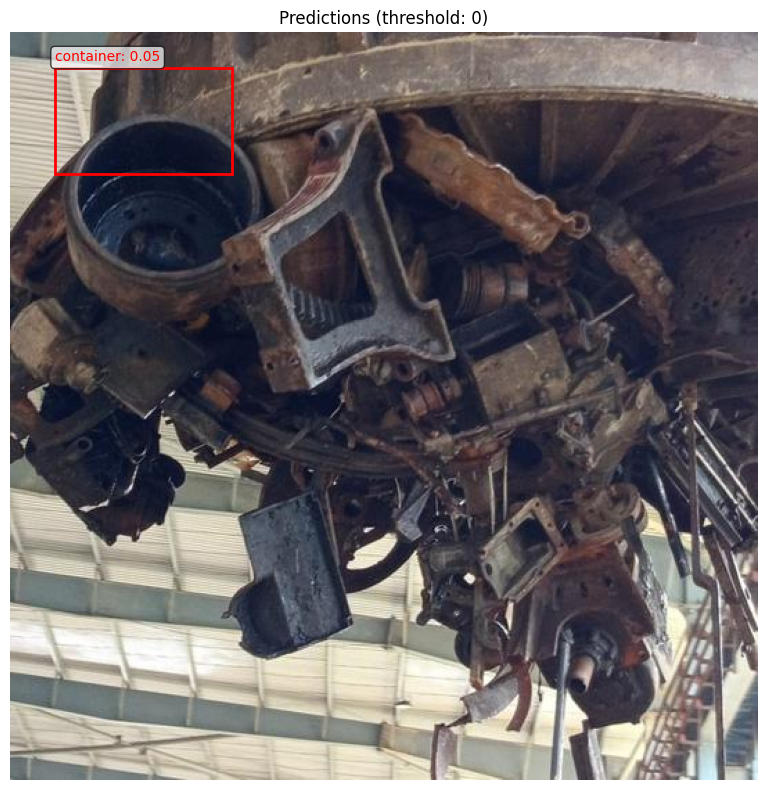

Testing:   4%|▍         | 13/294 [00:05<02:15,  2.07it/s]


Image 14:
Number of detections (confidence > 0): 0
No detections above threshold

Image 15:
Number of detections (confidence > 0): 6
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.393, Box: [261.1, 344.2, 326.3, 414.7]
  2. Class: Shock absorber (ID: 4), Score: 0.347, Box: [259.7, 346.5, 323.3, 417.0]
  3. Class: Cylinder (ID: 2), Score: 0.182, Box: [110.0, 306.1, 281.2, 466.8]
  4. Class: Cylinder (ID: 2), Score: 0.123, Box: [238.2, 56.9, 286.7, 121.1]
  5. Class: Cylinder (ID: 2), Score: 0.076, Box: [90.8, 137.1, 306.9, 480.4]
  6. Class: Cylinder (ID: 2), Score: 0.055, Box: [324.7, 61.3, 459.8, 166.3]


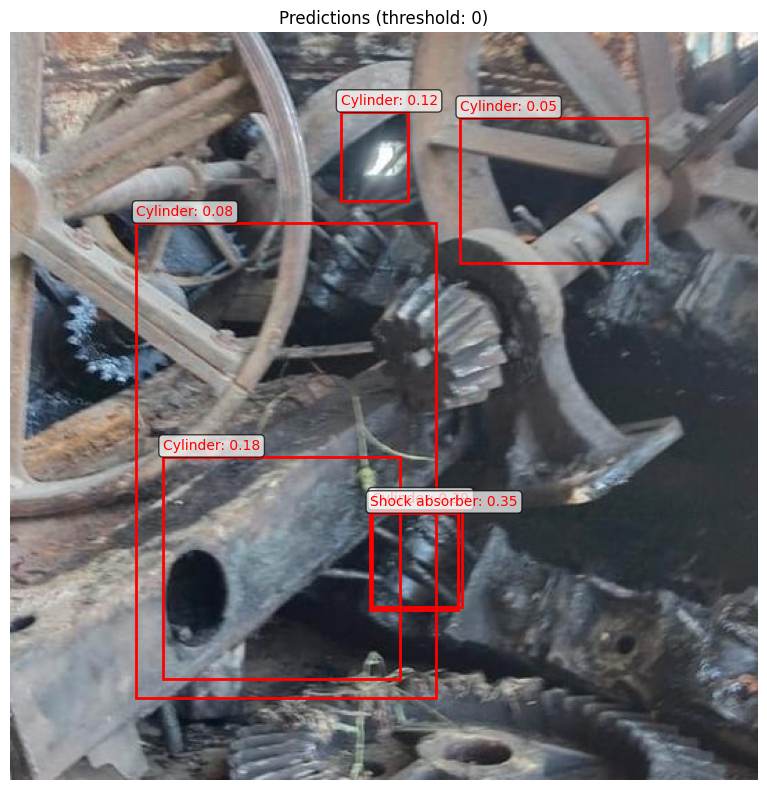

Testing:   5%|▌         | 15/294 [00:05<01:46,  2.63it/s]


Image 16:
Number of detections (confidence > 0): 3
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.339, Box: [10.7, 126.6, 309.8, 313.5]
  2. Class: Cylinder (ID: 2), Score: 0.059, Box: [212.2, 304.4, 519.5, 507.2]
  3. Class: Cylinder (ID: 2), Score: 0.050, Box: [291.2, 270.2, 310.3, 291.0]


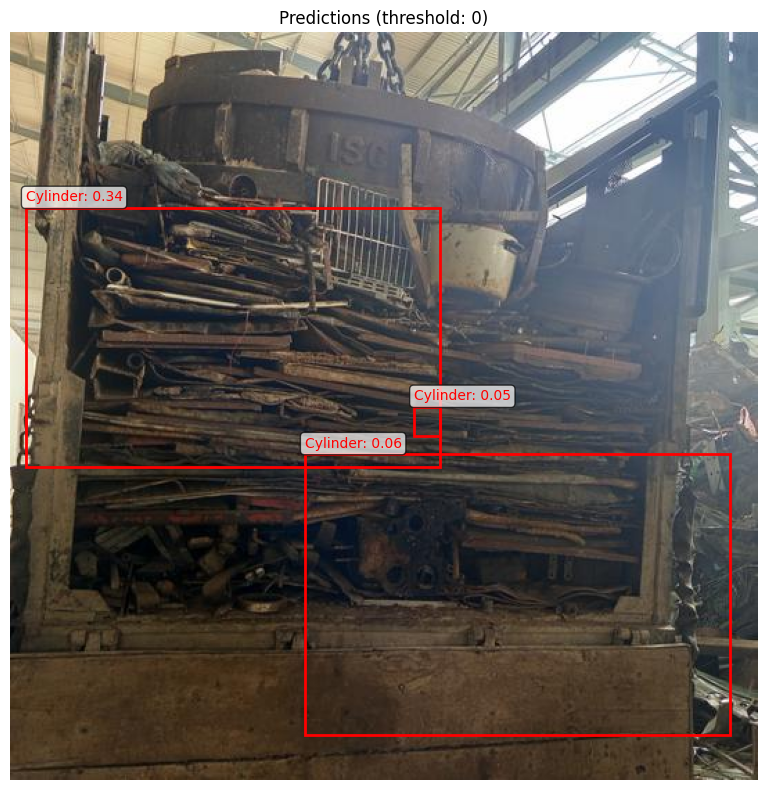

Testing:   5%|▌         | 16/294 [00:06<01:52,  2.47it/s]


Image 17:
Number of detections (confidence > 0): 2
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.403, Box: [167.4, 312.1, 281.4, 374.9]
  2. Class: Cylinder (ID: 2), Score: 0.135, Box: [1.6, 451.1, 63.8, 529.8]


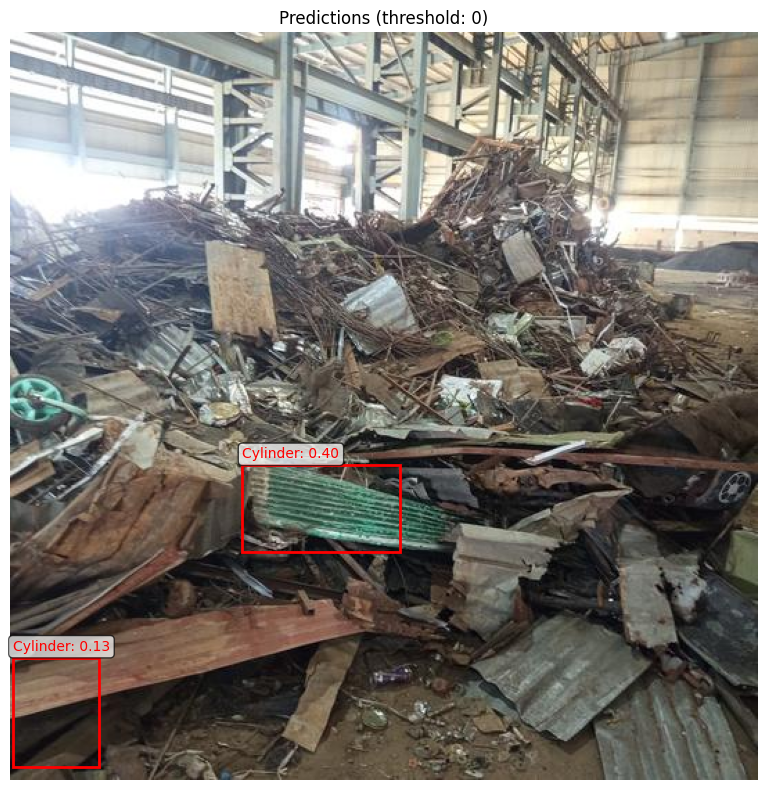

Testing:   6%|▌         | 17/294 [00:06<01:58,  2.33it/s]


Image 18:
Number of detections (confidence > 0): 0
No detections above threshold

Image 19:
Number of detections (confidence > 0): 1
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.093, Box: [380.8, 245.2, 448.9, 285.6]


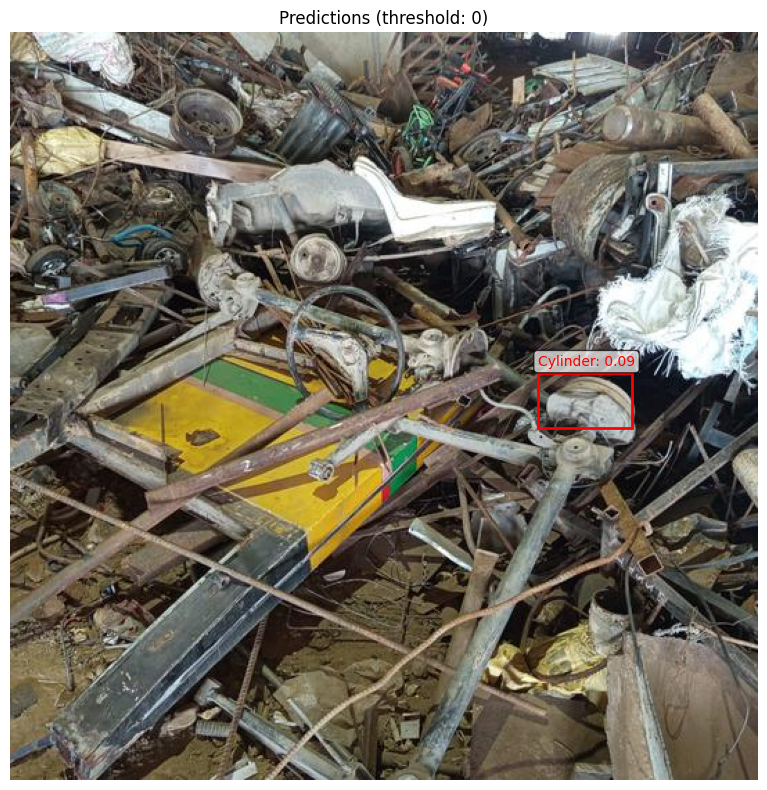

Testing:   6%|▋         | 19/294 [00:07<01:40,  2.75it/s]


Image 20:
Number of detections (confidence > 0): 5
Predictions:
  1. Class: Cylinder (ID: 2), Score: 0.987, Box: [70.7, 206.3, 120.9, 248.0]
  2. Class: Cylinder (ID: 2), Score: 0.630, Box: [285.4, 199.2, 329.3, 242.6]
  3. Class: Cylinder (ID: 2), Score: 0.147, Box: [47.3, 361.0, 134.3, 438.3]
  4. Class: Cylinder (ID: 2), Score: 0.072, Box: [77.6, 98.3, 145.0, 168.6]
  5. Class: Shock absorber (ID: 4), Score: 0.053, Box: [82.7, 108.1, 141.5, 159.1]


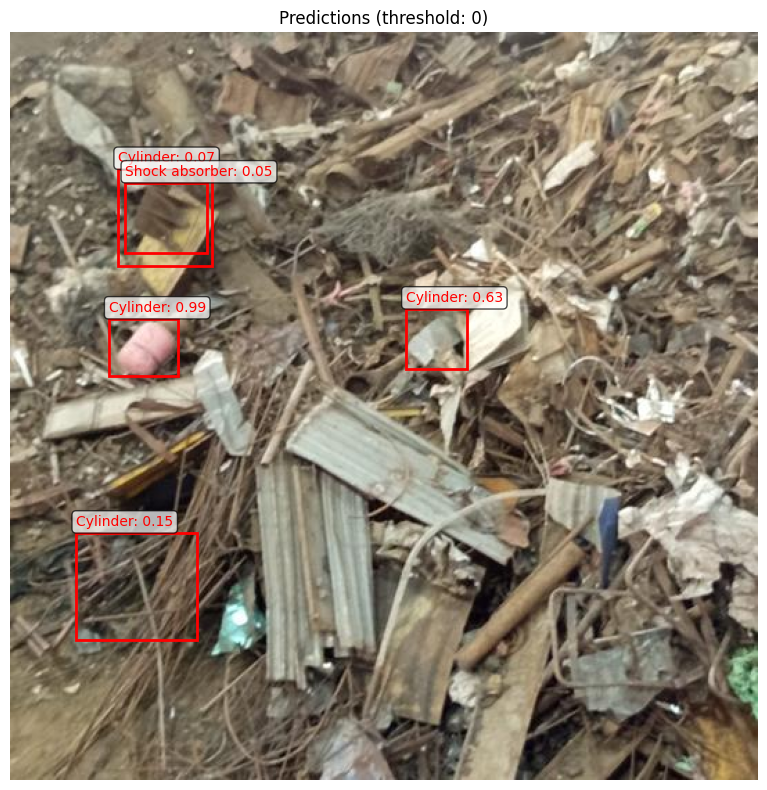

Testing:   6%|▋         | 19/294 [00:07<01:55,  2.38it/s]


In [18]:
model.eval()

num = 0
total_predictions = 0
confidence_threshold = 0

with torch.no_grad():
    for image_path in tqdm(TEST_IMAGES, desc="Testing"):

        image = Image.open(image_path)
        my_transforms = transforms.Compose([
            transforms.ToTensor(), 
            # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])

        image = my_transforms(image).unsqueeze(0)
        image = image.to(device)
        # print(image.shape) #torch.Size([1, 3, 540, 540])

        # Get predictions
        output = model(image)[0]
        
        # Process each image in the batch
        class_ids = output["labels"].cpu()
        boxes = output["boxes"].cpu()
        scores = output["scores"].cpu()
        
        # Filter by confidence threshold
        valid_mask = scores >= confidence_threshold
        filtered_boxes = boxes[valid_mask]
        filtered_labels = class_ids[valid_mask]
        filtered_scores = scores[valid_mask]
        
        total_predictions += len(filtered_labels)
        
        print(f"\nImage {num + 1}:")
        print(f"Number of detections (confidence > {confidence_threshold}): {len(filtered_labels)}")
        
        if len(filtered_labels) > 0:
            print("Predictions:")
            for j, (box, label, score) in enumerate(zip(filtered_boxes, filtered_labels, filtered_scores)):
                x1, y1, x2, y2 = box
                print(f"  {j+1}. Class: {class_names[label]} (ID: {label}), "
                        f"Score: {score:.3f}, Box: [{x1:.1f}, {y1:.1f}, {x2:.1f}, {y2:.1f}]")
            
            # Visualize first few images
            if num < 20:  # Show first 5 images

                # As we had unsqueezed the image to add batch, we again squeeze it to make 3 dimension
                visualize_predictions(image.squeeze(0), filtered_boxes, filtered_labels, filtered_scores, confidence_threshold)
        else:
            print("No detections above threshold")
        
        num += 1
        
        # Stop after testing a few images for demo
        if num >= 20:  # Test first 10 images
            break

In [19]:
torchvision.transforms.ToTensor()(Image.open(TEST_IMAGES[0])).shape

torch.Size([3, 540, 540])